In [23]:
# loading libraries
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


data_cv/20230411_184548.jpg
Image 1 Processed
Corners found for image 1


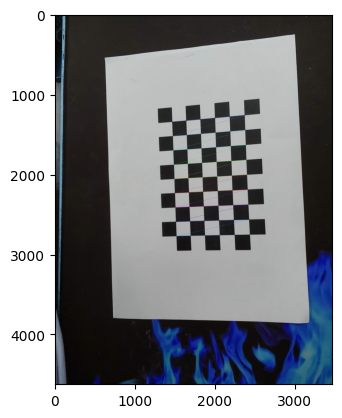

data_cv/20230411_184855.jpg
Image 2 Processed
Corners found for image 2


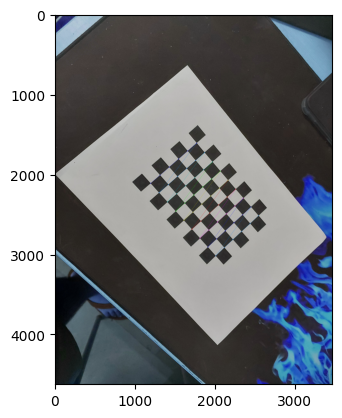

data_cv/20230411_184601.jpg
Image 3 Processed
Corners found for image 3


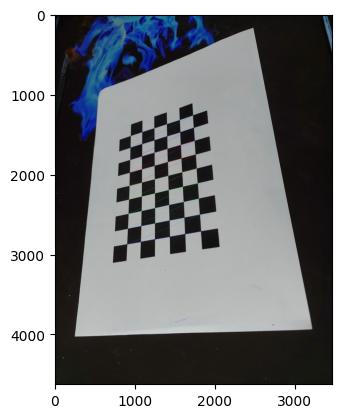

data_cv/20230411_184821.jpg
Image 4 Processed
Corners found for image 4


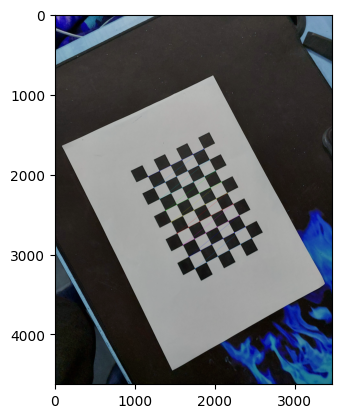

data_cv/20230411_184551.jpg
Image 5 Processed
Corners found for image 5


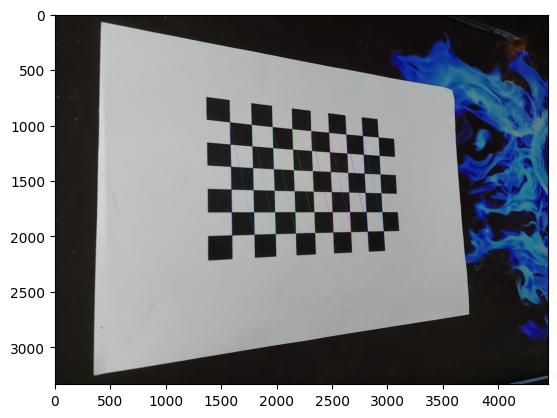

data_cv/20230411_184937.jpg
Image 6 Processed
Corners found for image 6


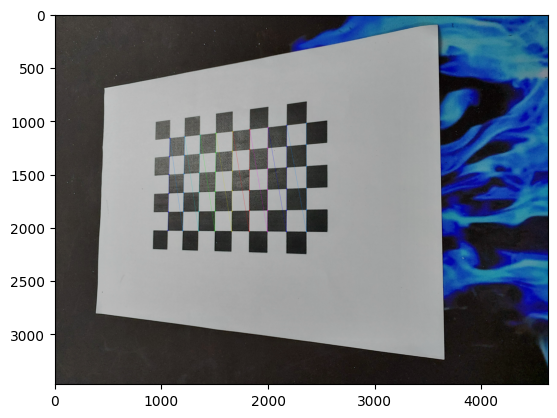

data_cv/20230411_184633.jpg
Image 7 Processed
Corners found for image 7


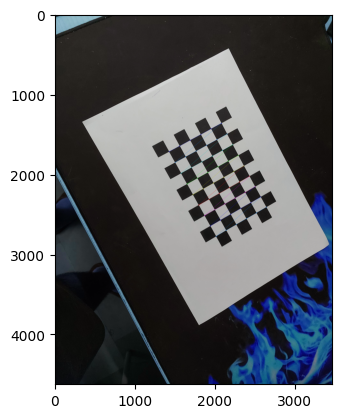

data_cv/20230411_184325.jpg
Image 8 Processed
Corners found for image 8


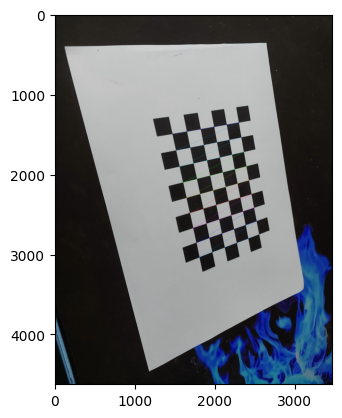

data_cv/20230411_184318.jpg
Image 9 Processed
Corners found for image 9


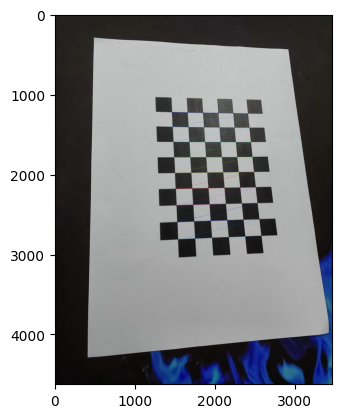

data_cv/20230411_184502.jpg
Image 10 Processed
Corners found for image 10


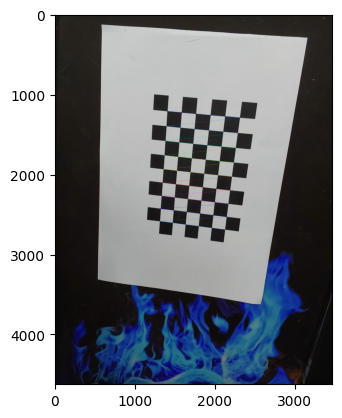

data_cv/20230411_184832.jpg
Image 11 Processed
Corners found for image 11


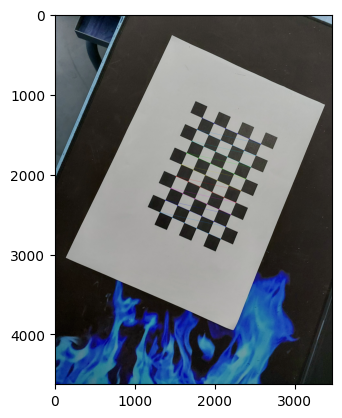

data_cv/20230411_184930.jpg
Image 12 Processed
Corners found for image 12


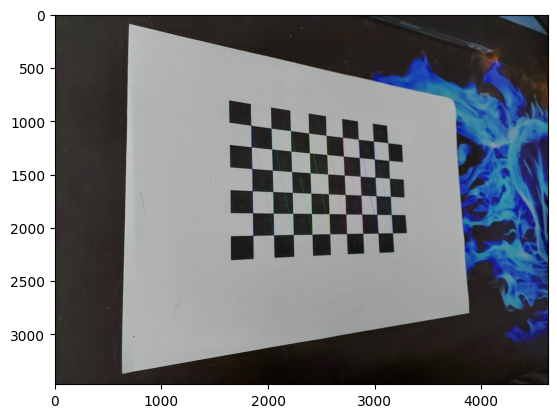

data_cv/20230411_184839.jpg
Image 13 Processed
Corners found for image 13


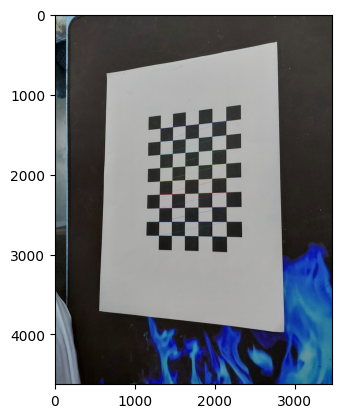

data_cv/20230411_185007.jpg
Image 14 Processed
Corners found for image 14


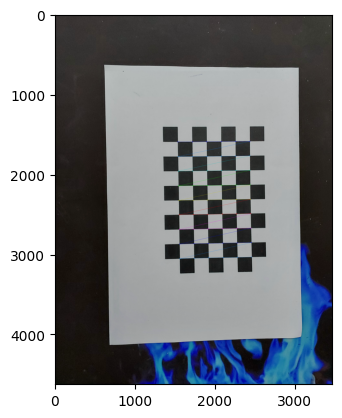

data_cv/20230411_184341.jpg
Image 15 Processed
Corners found for image 15


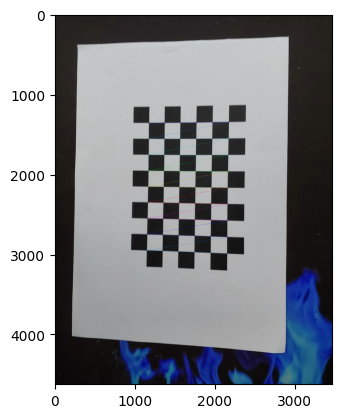

data_cv/20230411_184439.jpg
Image 16 Processed
Corners found for image 16


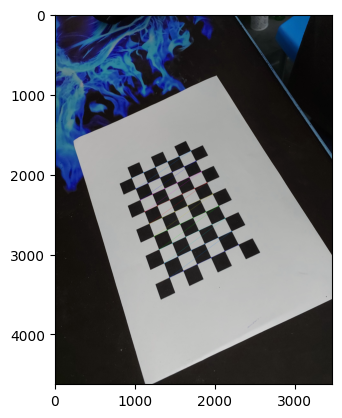

data_cv/20230411_184454.jpg
Image 17 Processed
Corners found for image 17


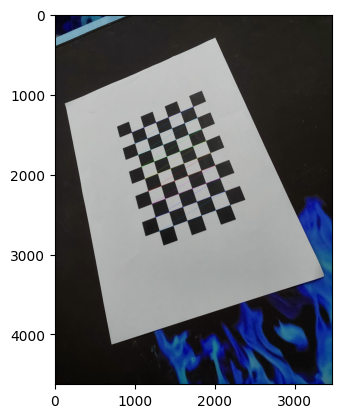

data_cv/20230411_184707.jpg
Image 18 Processed
Corners found for image 18


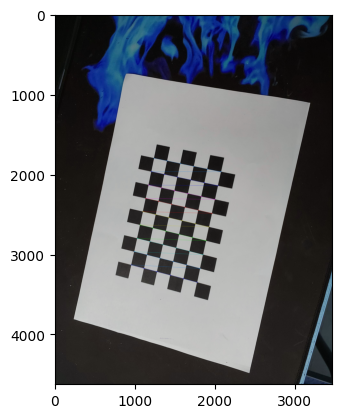

data_cv/20230411_184620.jpg
Image 19 Processed
Corners found for image 19


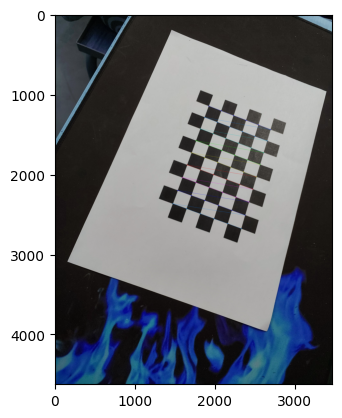

data_cv/20230411_184922.jpg
Image 20 Processed
Corners found for image 20


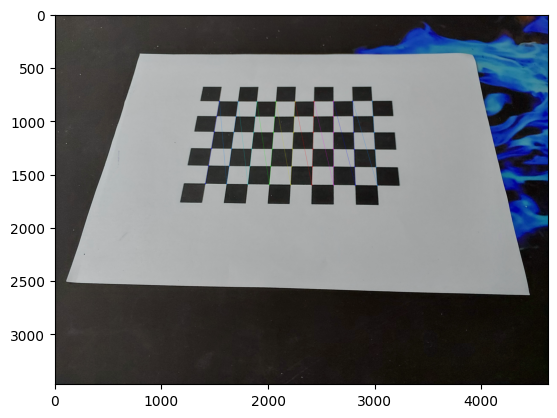

data_cv/20230411_184647.jpg
Image 21 Processed
Corners found for image 21


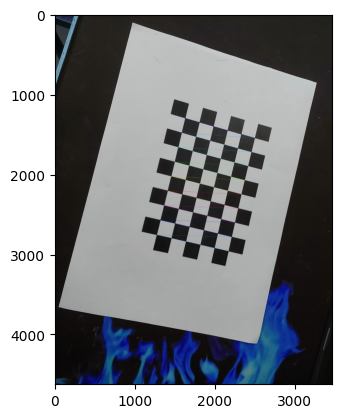

data_cv/20230411_184540.jpg
Image 22 Processed
Corners found for image 22


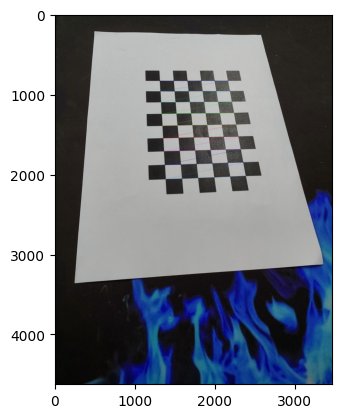

data_cv/20230411_184432.jpg
Image 23 Processed
Corners found for image 23


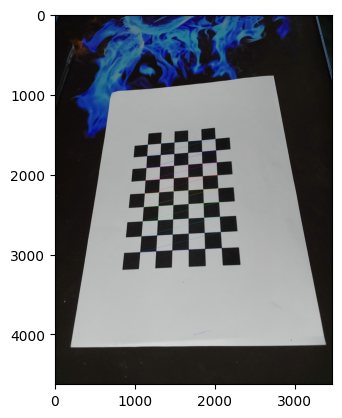

data_cv/20230411_184447.jpg
Image 24 Processed
Corners found for image 24


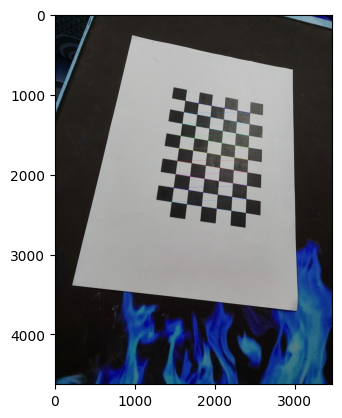

data_cv/20230411_184561.jpg
Image 25 Processed
Corners found for image 25


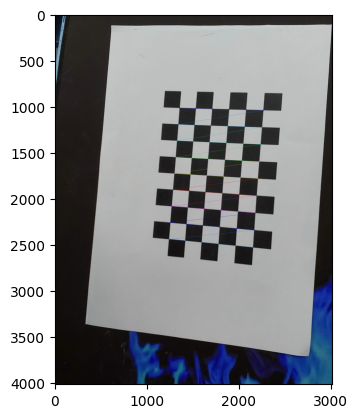

In [4]:
#defining criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:6,0:9].T.reshape(-1,2)
# defining object and image point arrays
objpoints = []
imgpoints = []
n=1
# collecting the images together
images = glob.glob('data_cv/*.jpg')
for fname in images:
    print(fname)
    # reading the images
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    # finding if the images contains checkerboard or not
    ret, corners = cv.findChessboardCorners(gray, (6,9), None)
    print("Image", n, "Processed")
    if ret == True:
        print("Corners found for image", n)
        # finding objects and corners
        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        # finally drawing the checkerboard pattern on the image
        cv.drawChessboardCorners(img, (6,9), corners2, ret)
    # plotting the image
    plt.imshow(img)
    plt.show()
    n+=1

In [5]:
# getting intrensic paramnter matrix, extrensic paramters & distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("Intrinsic Parameters")
print(mtx)

Intrinsic Parameters
[[3.47728720e+03 0.00000000e+00 1.72992761e+03]
 [0.00000000e+00 3.48716594e+03 2.22040130e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [6]:
print("Extrinsic Parameters")
print("Rotation Vectors:")
print(rvecs)
print("Translation vectors:")
print(tvecs)

Extrinsic Parameters
Rotation Vectors:
(array([[-0.05027587],
       [ 0.17073214],
       [-0.04252389]]), array([[ 0.03342594],
       [-0.15821607],
       [-0.7237723 ]]), array([[0.60239815],
       [0.57367012],
       [2.88497106]]), array([[-0.12331685],
       [-0.08837152],
       [-0.47477047]]), array([[ 0.20626741],
       [-0.24664723],
       [-1.58909282]]), array([[-0.3361067 ],
       [ 0.40768885],
       [-1.51072676]]), array([[ 0.00644111],
       [-0.13599916],
       [-0.50680222]]), array([[ 0.06639143],
       [-0.45364487],
       [-0.23228168]]), array([[-0.24432684],
       [-0.143595  ],
       [-0.0405986 ]]), array([[0.20043661],
       [0.11538154],
       [0.10792777]]), array([[-0.11162908],
       [-0.01946365],
       [ 0.41449773]]), array([[ 0.22003032],
       [-0.27965155],
       [-1.5754343 ]]), array([[-0.12489593],
       [ 0.3187581 ],
       [-0.01478638]]), array([[-0.02684408],
       [-0.0471118 ],
       [-0.01527382]]), array([[-0.030

In [8]:
print("Distortion Coefficients")
print(dist)

Distortion Coefficients
[[ 0.31187401 -2.8687774  -0.01079368 -0.00551166  5.38258322]]


data_cv/20230411_184548.jpg


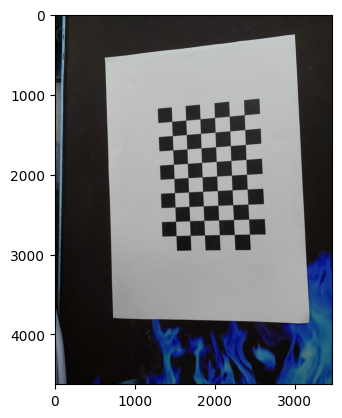

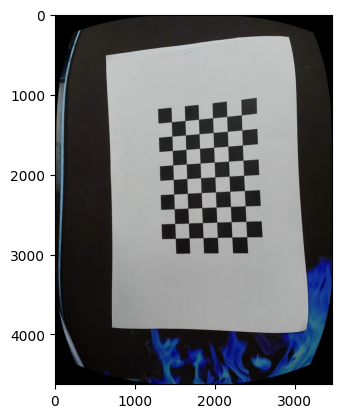


-------------------------------

data_cv/20230411_184855.jpg


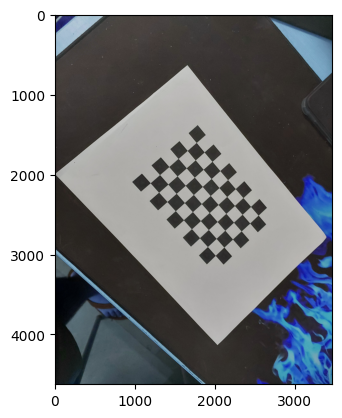

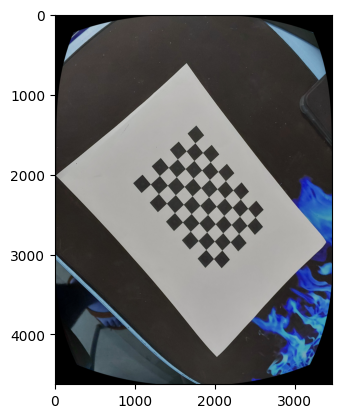


-------------------------------

data_cv/20230411_184601.jpg


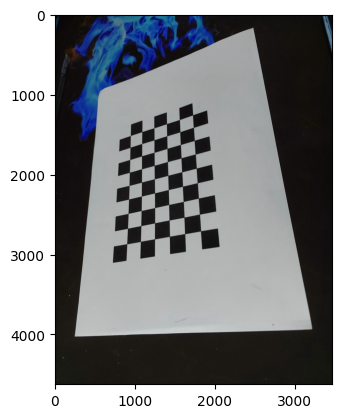

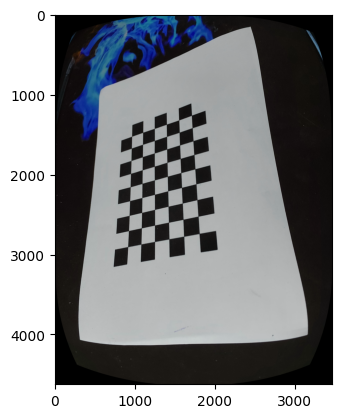


-------------------------------

data_cv/20230411_184821.jpg


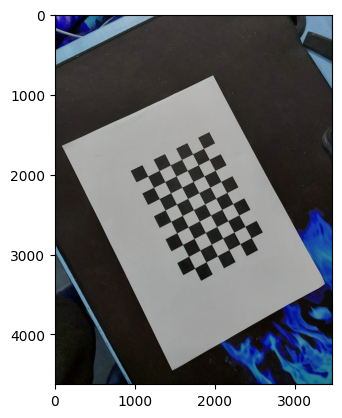

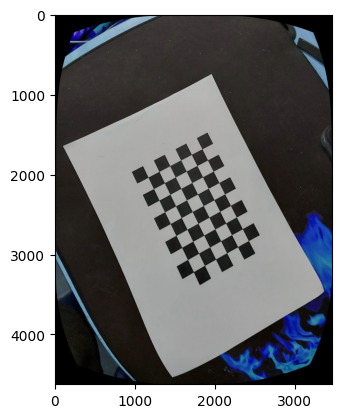


-------------------------------

data_cv/20230411_184551.jpg


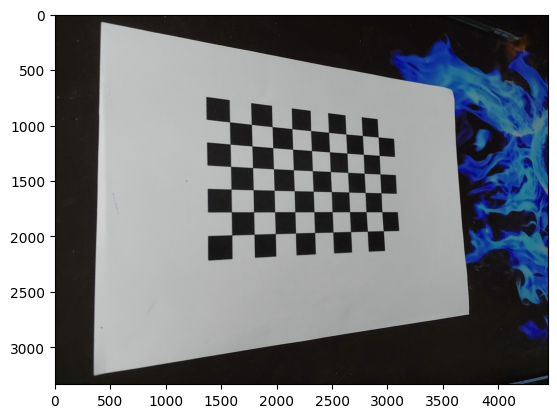

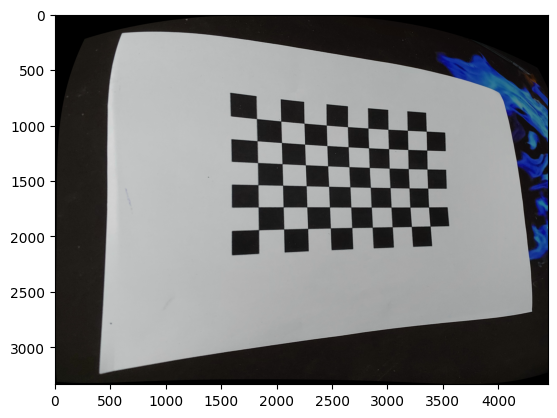


-------------------------------



In [25]:
for i in range(5):
    print(images[i])
    img = cv.imread(images[i])
    # calculating height and width of the image
    h,  w = img.shape[:2]
    # calculating new camera matrix
    newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))
    # undistoring the image
    dst = cv.undistort(img, mtx, dist, None, newcameramtx)
    # plotting both the distorted and the undistorted images
    plt.imshow(img)
    plt.show()
    plt.imshow(dst)
    plt.show()
    print("\n-------------------------------\n")

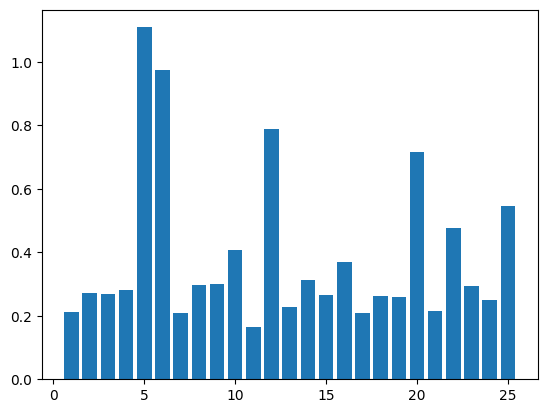

In [14]:
error = []
new_2d = []
for i in range(len(objpoints)):
    # calculating projected points
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    # caculating and appending re projection error
    error.append(cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2))
    new_2d.append(imgpoints2)
plt.bar(range(1, len(images)+1), error)
plt.show()

In [15]:
print("Mean of Reprojection Error:", np.mean(error))
print("Standard Deviation of Reprojection Error:", np.std(error))

Mean of Reprojection Error: 0.3877144148079726
Standard Deviation of Reprojection Error: 0.24504803502762892


data_cv/20230411_184548.jpg


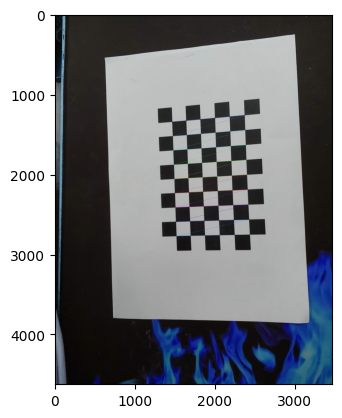

Image 1 Processed


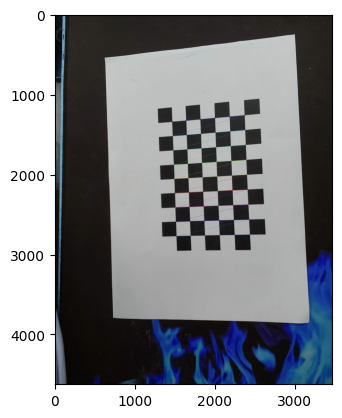


-------------------------------

data_cv/20230411_184855.jpg


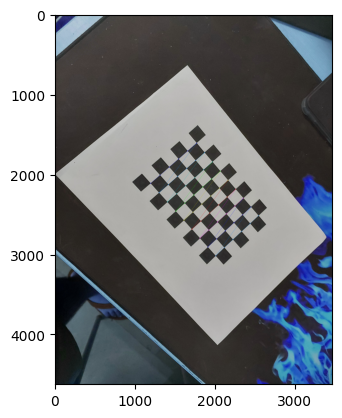

Image 2 Processed


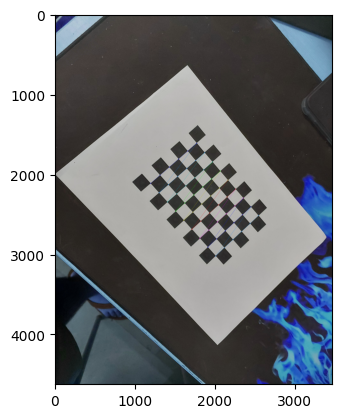


-------------------------------

data_cv/20230411_184601.jpg


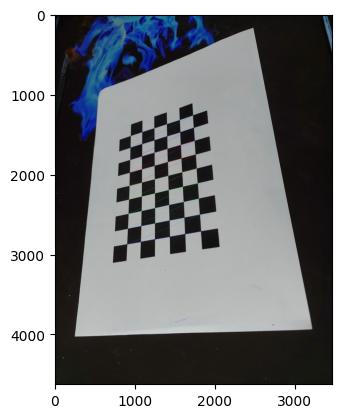

Image 3 Processed


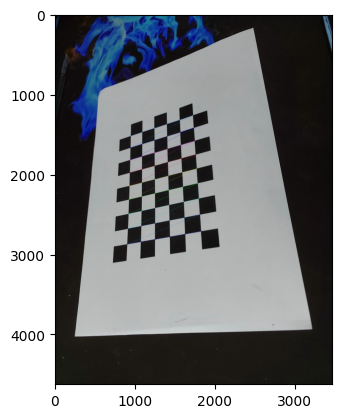


-------------------------------

data_cv/20230411_184821.jpg


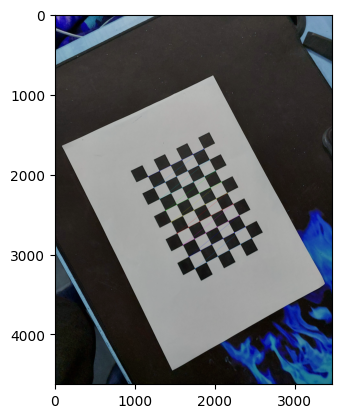

Image 4 Processed


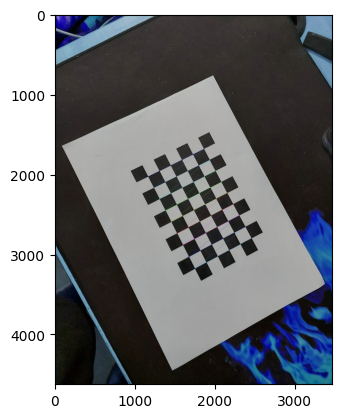


-------------------------------

data_cv/20230411_184551.jpg


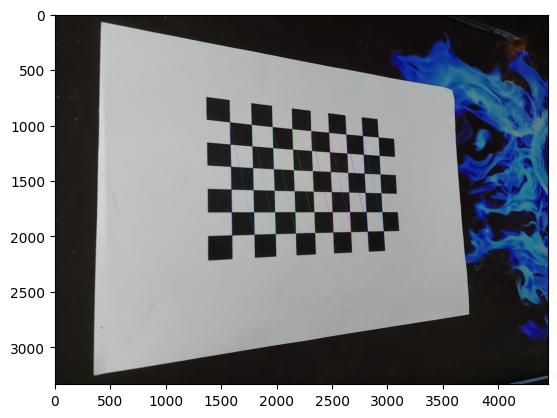

Image 5 Processed


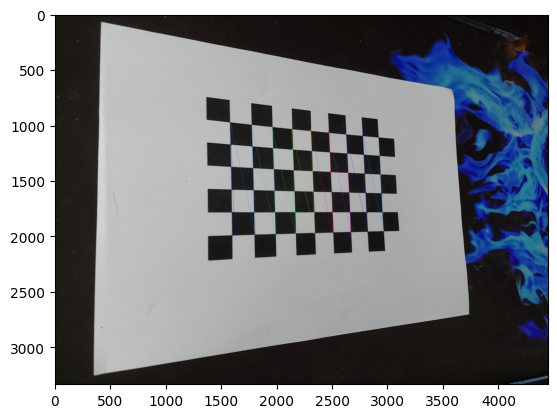


-------------------------------

data_cv/20230411_184937.jpg


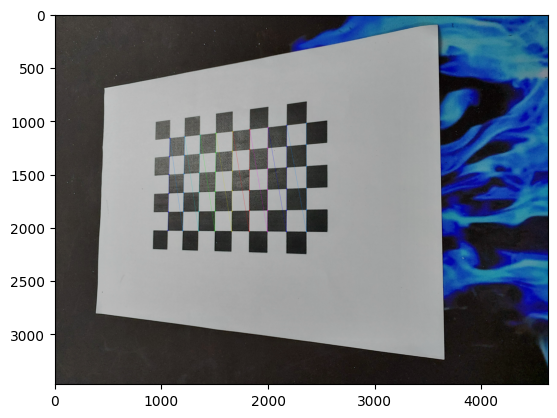

Image 6 Processed


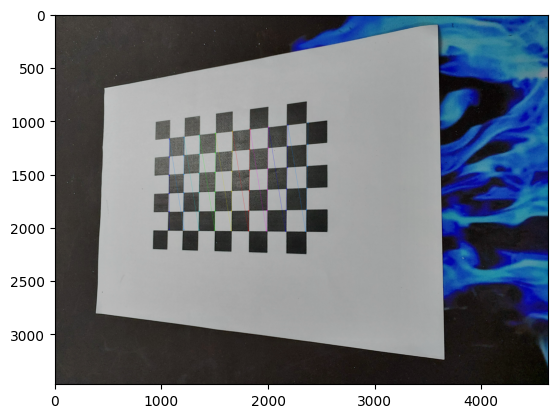


-------------------------------

data_cv/20230411_184633.jpg


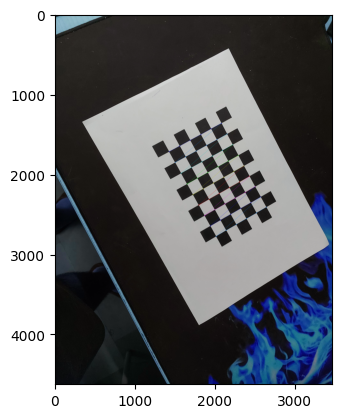

Image 7 Processed


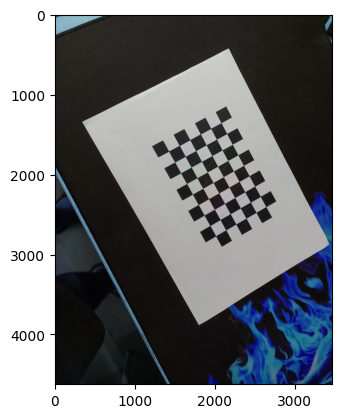


-------------------------------

data_cv/20230411_184325.jpg


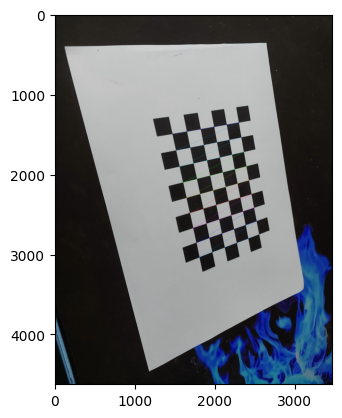

Image 8 Processed


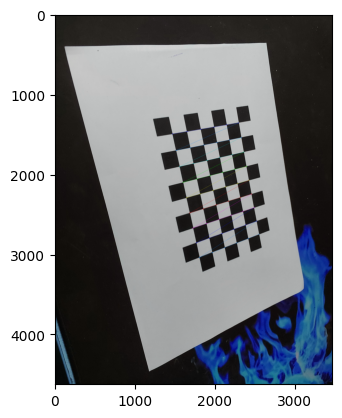


-------------------------------

data_cv/20230411_184318.jpg


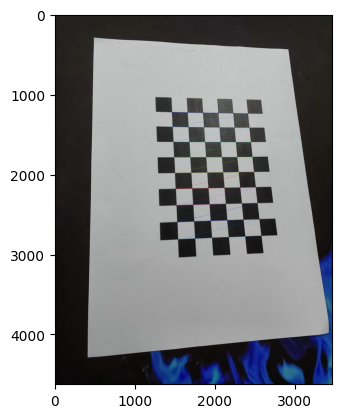

Image 9 Processed


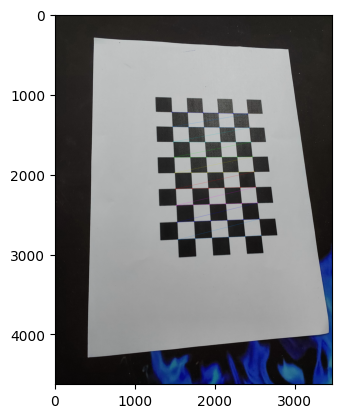


-------------------------------

data_cv/20230411_184502.jpg


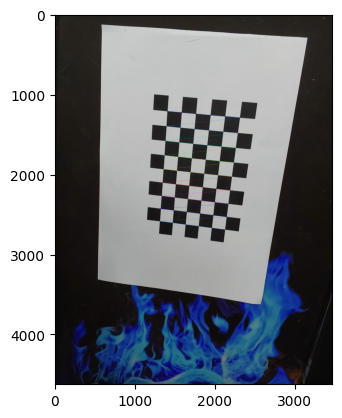

Image 10 Processed


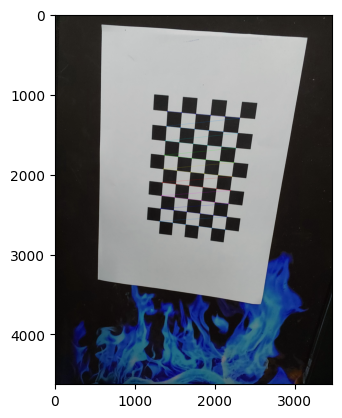


-------------------------------

data_cv/20230411_184832.jpg


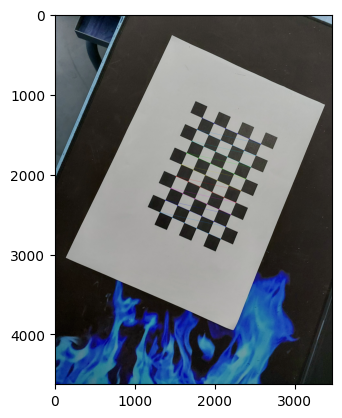

Image 11 Processed


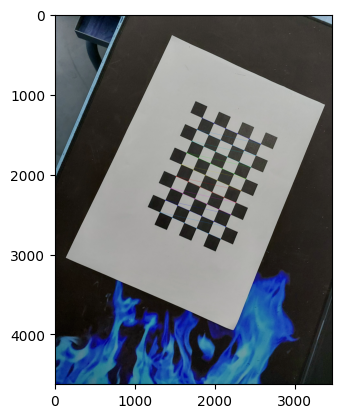


-------------------------------

data_cv/20230411_184930.jpg


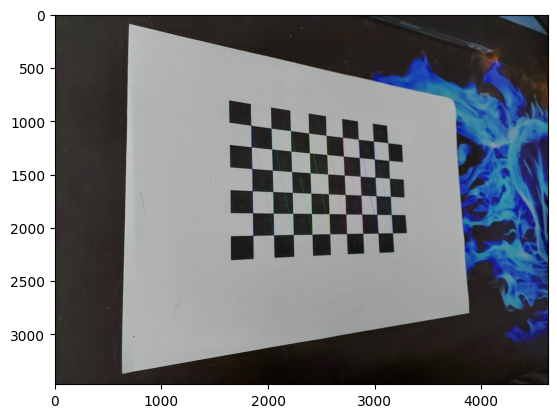

Image 12 Processed


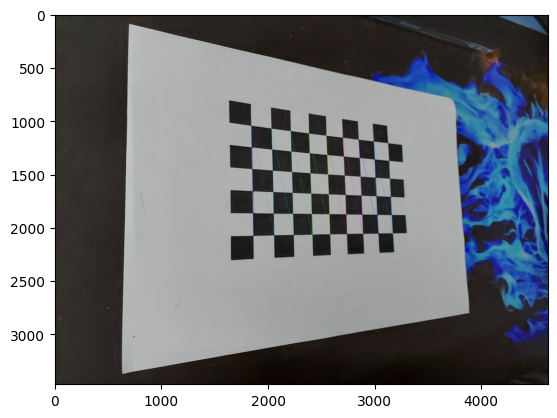


-------------------------------

data_cv/20230411_184839.jpg


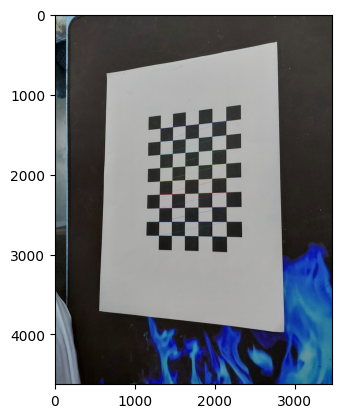

Image 13 Processed


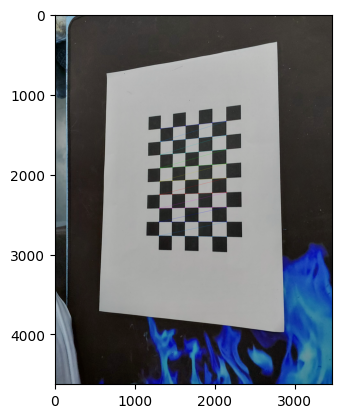


-------------------------------

data_cv/20230411_185007.jpg


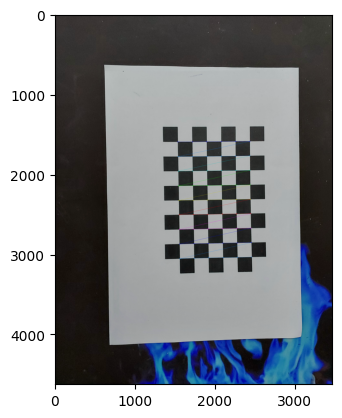

Image 14 Processed


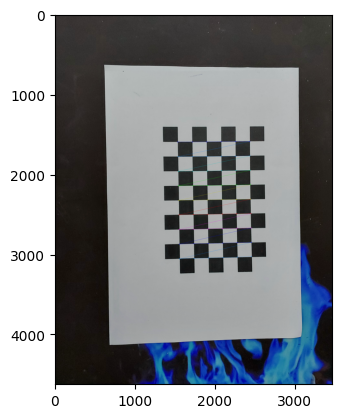


-------------------------------

data_cv/20230411_184341.jpg


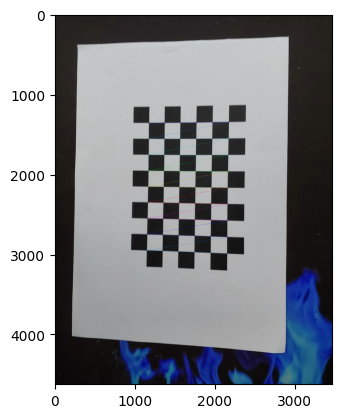

Image 15 Processed


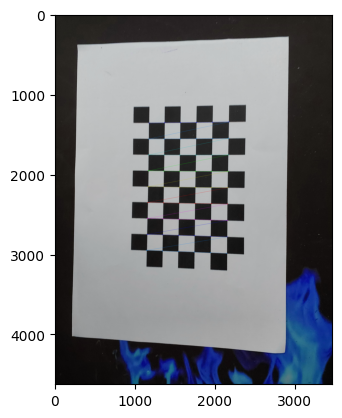


-------------------------------

data_cv/20230411_184439.jpg


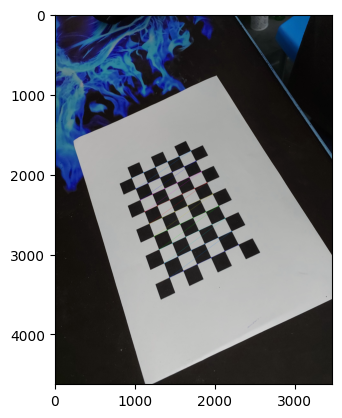

Image 16 Processed


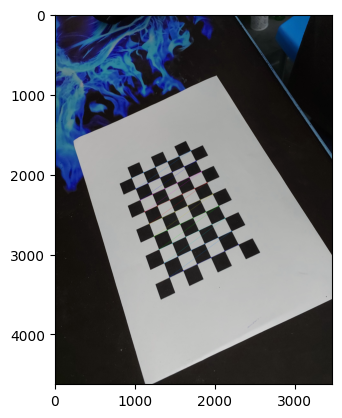


-------------------------------

data_cv/20230411_184454.jpg


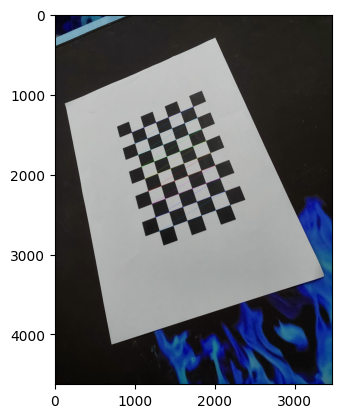

Image 17 Processed


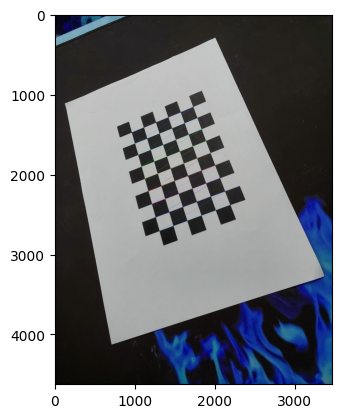


-------------------------------

data_cv/20230411_184707.jpg


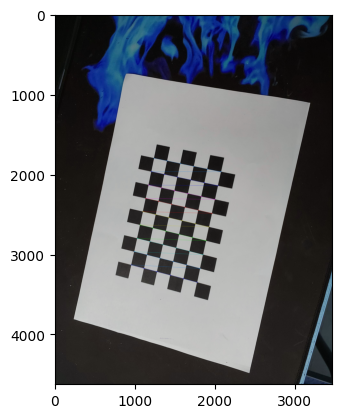

Image 18 Processed


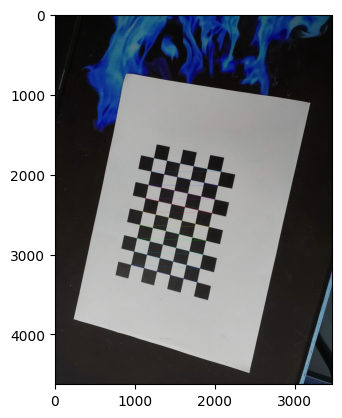


-------------------------------

data_cv/20230411_184620.jpg


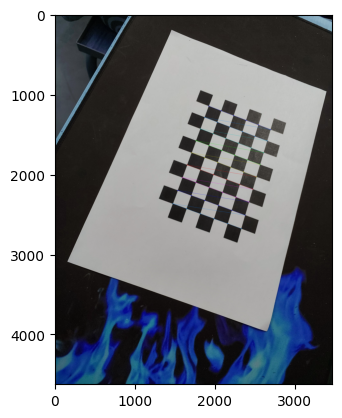

Image 19 Processed


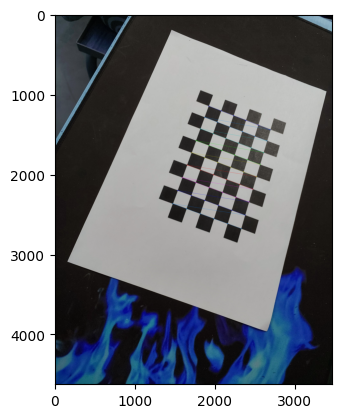


-------------------------------

data_cv/20230411_184922.jpg


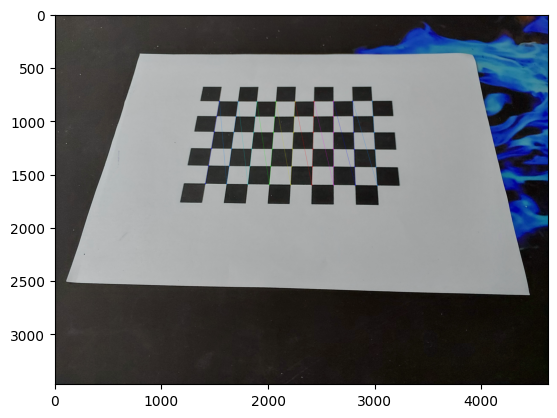

Image 20 Processed


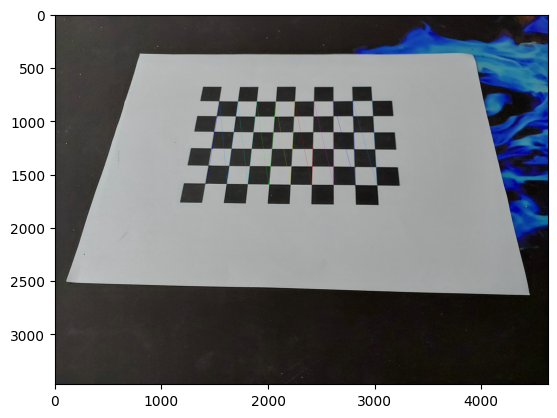


-------------------------------

data_cv/20230411_184647.jpg


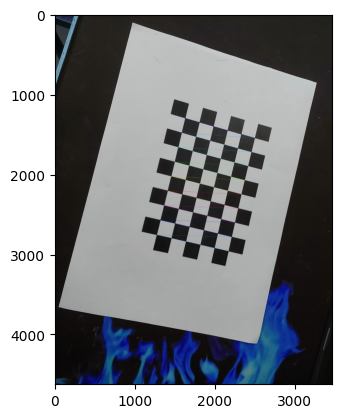

Image 21 Processed


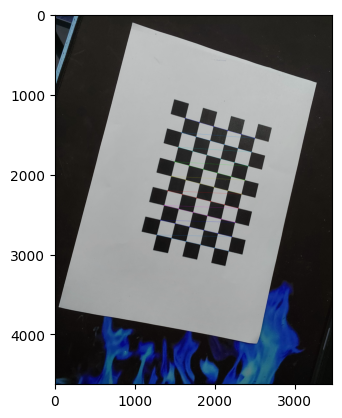


-------------------------------

data_cv/20230411_184540.jpg


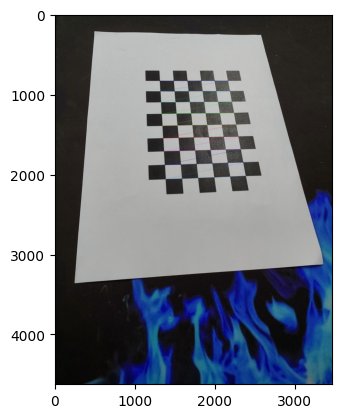

Image 22 Processed


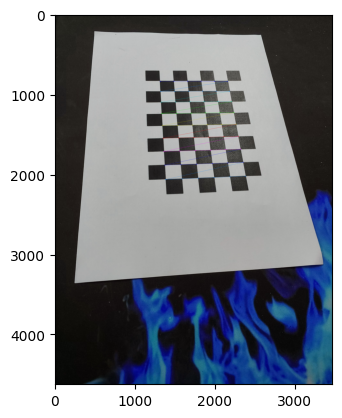


-------------------------------

data_cv/20230411_184432.jpg


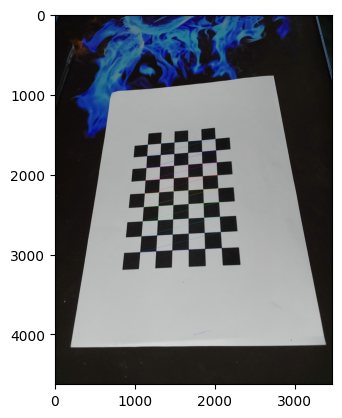

Image 23 Processed


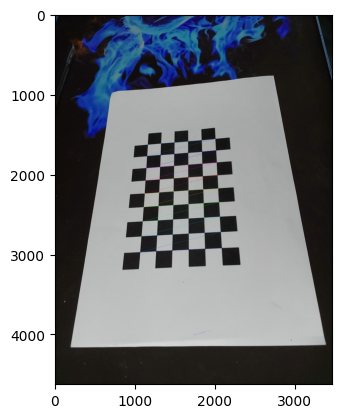


-------------------------------

data_cv/20230411_184447.jpg


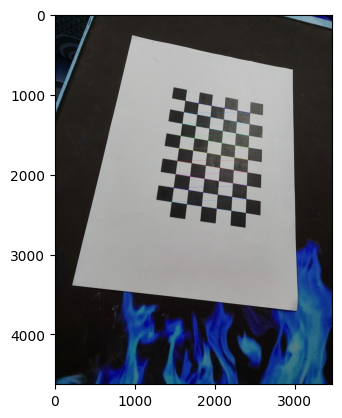

Image 24 Processed


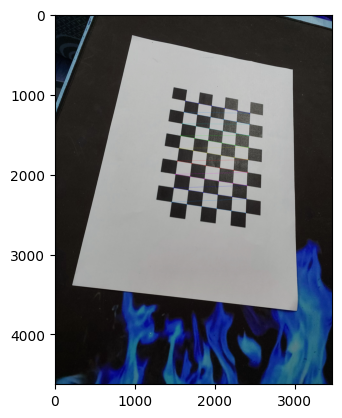


-------------------------------

data_cv/20230411_184561.jpg


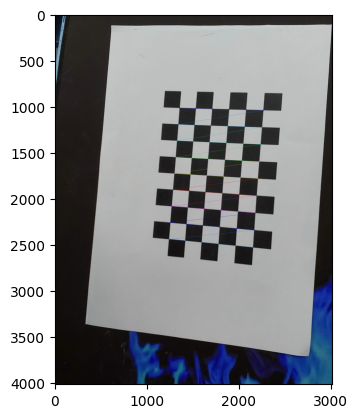

Image 25 Processed


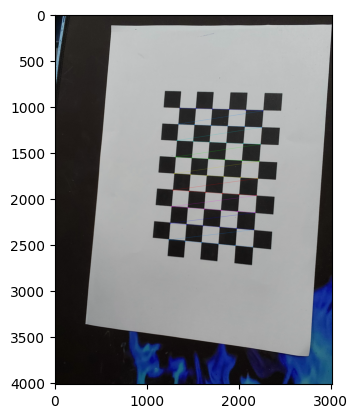


-------------------------------



In [24]:
n=1
for fname in images:
    print(fname)
    img = cv.imread(fname)
    img1 = cv.imread(fname)
    # drawing checker board on original image
    cv.drawChessboardCorners(img, (6,9), imgpoints[n-1], ret)
    plt.imshow(img)
    plt.show()
    # drawing checker board on re proejcted image
    cv.drawChessboardCorners(img1, (6,9), new_2d[n-1], ret)
    print("\nImage", n, "Processed\n")
    plt.imshow(img1)
    # plotting them both
    plt.show()
    n+=1
    print("\n-------------------------------\n")

In [26]:
for i in range(len(images)):
    # calculating rotation matrix
    rmat = cv.Rodrigues(rvecs[i])[0]
    rmat_inv = np.linalg.inv(rmat)
    # multiplying inverted rotation matrix to translation vector
    tvec_inv = rmat_inv.dot(tvecs[i])
    # dot product with unit vector in z-direction
    plane_normal = rmat_inv.dot(np.array([0,0,1]))
    print("Plane normal for image ", images[i], "\n")
    print(plane_normal)

Plane normal for image  data_cv/20230411_184548.jpg 

[-0.16871491 -0.05361574  0.98420558]
Plane normal for image  data_cv/20230411_184855.jpg 

[0.13255465 0.0851247  0.98751357]
Plane normal for image  data_cv/20230411_184601.jpg 

[0.35720541 0.39321161 0.84722424]
Plane normal for image  data_cv/20230411_184821.jpg 

[ 0.11343035 -0.09772671  0.98872799]
Plane normal for image  data_cv/20230411_184551.jpg 

[0.02094455 0.28369642 0.95868539]
Plane normal for image  data_cv/20230411_184937.jpg 

[-0.05050892 -0.45749562  0.88777621]
Plane normal for image  data_cv/20230411_184633.jpg 

[0.12824744 0.03982821 0.99094213]
Plane normal for image  data_cv/20230411_184325.jpg 

[0.42639231 0.11504391 0.89719256]
Plane normal for image  data_cv/20230411_184318.jpg 

[ 0.14656731 -0.23810783  0.96011597]
Plane normal for image  data_cv/20230411_184502.jpg 

[-0.10337527  0.20446046  0.97340098]
Plane normal for image  data_cv/20230411_184832.jpg 

[-0.00391103 -0.11219743  0.99367824]
Pla